In [151]:
# The phenotypic characteristics of each stomata complex is extracted by the Mask RCNN and CellProifler pipeline
# !pip install pycytominer
import pandas as pd
import pycytominer
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np

In [152]:
os.getcwd()

'/Users/houlinyu/Documents/StomataProject/Oscar_data'

In [248]:
df = pd.read_csv("./GC_SC_merge.csv")

df['Metadata_genotype.x'] = df['Metadata_genotype.x'].replace('ki3', 'Ki3')

df['Metadata_genotype.x'] = df['Metadata_genotype.x'].replace('p39', 'P39')

df['Metadata_genotype.x'] = df['Metadata_genotype.x'].replace('P39Gb', 'P39')

print(df['Metadata_genotype.x'].unique())

# Get the dimensions of the DataFrame 
num_rows, num_columns = df.shape
print(f"Number of Rows: {num_rows}, Number of Columns: {num_columns}")

# filter the df [for this step, around 9 guard cells have extremely small values and 0, so I just deleted them.]

df_filtered = df[df['GCO_AreaShape_Area'] >= 100]
num_rows, num_columns = df_filtered.shape
print(f"Number of Rows: {num_rows}, Number of Columns: {num_columns}")
# Convert 'Metadata_number.x' column to the same data type as 'Round'
df_filtered['Metadata_number.x'] = df_filtered['Metadata_number.x'].astype(str)


['B73' 'CML103' 'CML228' 'HP301' 'Ki3' 'Mo17' 'Mo18w' 'Ms71' 'NC358' 'P39']
Number of Rows: 2434, Number of Columns: 118
Number of Rows: 2425, Number of Columns: 118


/var/folders/gt/w451x6dd2xs29hm6r8jx9bph0000gn/T/ipykernel_9473/3461631933.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Metadata_number.x'] = df_filtered['Metadata_number.x'].astype(str)


55


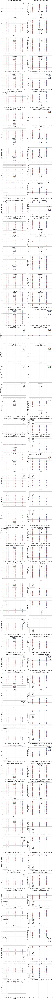

In [249]:
# Select relevant columns (assuming you want to plot all numeric columns except 'Metadata_number.x' and 'Metadata_Series.x')
numeric_columns = df_filtered.select_dtypes(include='number').columns.difference(['Metadata_number.x', 'Metadata_Series.x'])

# Define the number of columns for subplots
num_cols = 2
num_rows = (len(numeric_columns) + num_cols - 1) // num_cols
print(num_rows)

# Plotting using seaborn in a high-throughput way
sns.set(style="whitegrid")
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows))

for i, col in enumerate(numeric_columns):
    row_idx = i // num_cols
    col_idx = i % num_cols
    ax = axes[row_idx, col_idx] if num_rows > 1 else axes[col_idx]
    
    sns.scatterplot(x='Metadata_genotype.x', y=col, data=df_filtered, hue='Metadata_week.x', ax=ax)
    ax.set_title(f'Scatter Plot of {col} by Genotype')
    ax.set_xlabel('Genotype')
    ax.set_ylabel(col)

# Adjust layout
plt.tight_layout()
plt.show()

In [250]:
#preprocessing extracted features
#The first step: check the Missing values, and Print out columns with missing values, if any

num_rows, num_columns = df_filtered.shape
print(f"Number of Rows: {num_rows}, Number of Columns: {num_columns}")

columns_with_missing_values = df_filtered.columns[df_filtered.isnull().any()]
if not columns_with_missing_values.empty:
    print("Columns with missing values:")
    for column in columns_with_missing_values:
        print(column)
        
# Drop rows with missing values
df_noNA = df_filtered.dropna()

# Print number of rows and columns after dropping missing values
num_rows, num_columns = df_noNA.shape
print(f"Number of Rows: {num_rows}, Number of Columns: {num_columns}")

# Print missing values after dropping rows with missing values
missing_values = df_noNA.isnull().sum()
print("Missing values after dropping rows:")
print(missing_values)
print(df_noNA.shape)

Number of Rows: 2425, Number of Columns: 118
Number of Rows: 2425, Number of Columns: 118
Missing values after dropping rows:
Unnamed: 0                  0
ImageNumber.x               0
ObjectNumber                0
Metadata_FileLocation       0
Metadata_Frame.x            0
                           ..
sco2_Children_sco2_Count    0
Location_Center_X           0
Location_Center_Y           0
Location_Center_Z           0
Number_Object_Number        0
Length: 118, dtype: int64
(2425, 118)


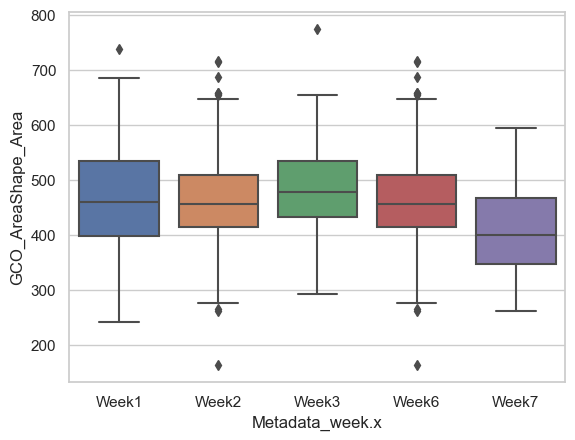

In [251]:
# The Batch-effect correction ?
# Assuming 'df' is your DataFrame

sns.boxplot(x='Metadata_week.x', y='GCO_AreaShape_Area', data=df_noNA)
plt.show()

In [252]:
#Feature Selection manually

df = df_noNA.copy()
print(df)
column_names_list = list(df.columns)
print(column_names_list)
features_list = [
    'Area',
    'Perimeter',
    'FormFactor',
    'Convex Area',
    'Solidity',
    'Extent',
    'BoundingBoxArea',
    'Eccentricity',
    'MajorAxisLength',
    'MinorAxisLength',
    'EquivalentDiameter',
    'Compactness',
    'MaximumRadius',
    'MedianRadius',
    'MeanRadius',
    'MinFeretDiameter',
    'MaxFeretDiameter'
]

# Find column names containing substrings from the features_list
matching_cols = [col for col in column_names_list if any(
    feature in col for feature in features_list) and 'Orientation' not in col and '_X' not in col and '_Y' not in col and 'EulerNumber' not in col]

col_lists = ['Metadata_number.x', 'Metadata_genotype.x'] + matching_cols
df_feature_filtered = df.loc[:, col_lists]
print(df_feature_filtered.shape)

      Unnamed: 0  ImageNumber.x  ObjectNumber  \
0              1              1             1   
1              2              1             2   
2              3              1             3   
3              4              1             4   
4              5              1             5   
...          ...            ...           ...   
2429        2430            201             9   
2430        2431            201            10   
2431        2432            201            11   
2432        2433            201            12   
2433        2434            201            13   

                                  Metadata_FileLocation  Metadata_Frame.x  \
0     file:/Users/houlinyu/Desktop/colored_masks/Wee...                 0   
1     file:/Users/houlinyu/Desktop/colored_masks/Wee...                 0   
2     file:/Users/houlinyu/Desktop/colored_masks/Wee...                 0   
3     file:/Users/houlinyu/Desktop/colored_masks/Wee...                 0   
4     file:/Users/houlinyu

In [253]:
# Check for infinity values in sco2_AreaShape_FormFactor column

df = df_feature_filtered.copy()
inf_mask = np.isinf(
df['sco2_AreaShape_FormFactor'])

# Print the number of INF values
num_inf_values = inf_mask.sum()
print("Number of INF values:", num_inf_values)

# Remove rows with INF values
df_feature_filtered = df[~inf_mask]

# Optionally, you can reset the index if needed
df_feature_filtered = df_feature_filtered.reset_index(drop=True)

# Save the cleaned DataFrame to a new CSV file
df_feature_filtered.to_csv("cleaned_df_without_inf.csv", index=False)
Transpose_cleaned_df_2=cleaned_df_2.transpose()
Transpose_cleaned_df_2.to_csv("Transpose_cleaned_df_2.csv")

Number of INF values: 1


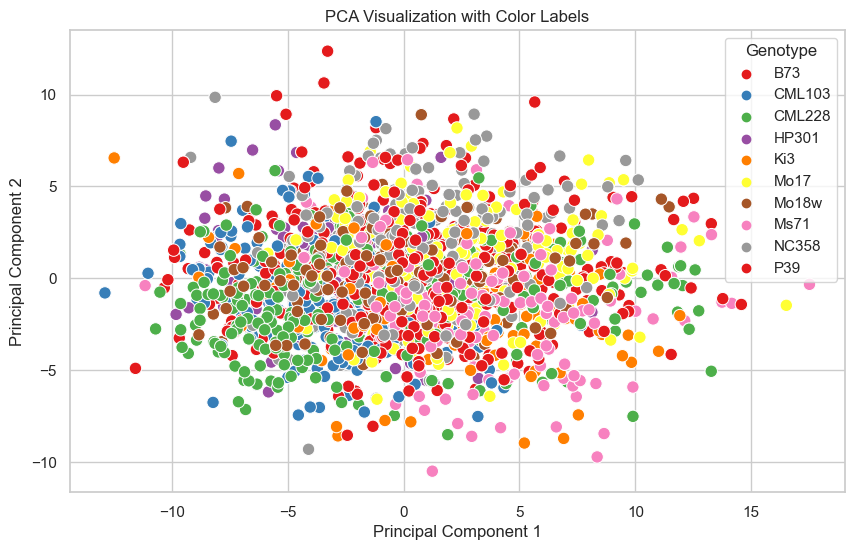

In [254]:
# Select numeric columns for normalization

df = df_feature_filtered

numeric_columns = df.select_dtypes(include='number')

# Create a StandardScaler, Z score normalization
scaler = StandardScaler()

# Fit and transform the selected numeric columns
normalized_data = scaler.fit_transform(numeric_columns)

# Replace the original numeric columns with the normalized values
df[numeric_columns.columns] = normalized_data

# Apply PCA
pca = PCA()
pca_result = pca.fit_transform(normalized_data)

# Create a DataFrame with PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
pca_df = pd.DataFrame(data=pca_result, columns=pca_columns)

# Concatenate the PCA DataFrame with non-numeric columns
final_df = pd.concat([df.drop(columns=numeric_columns.columns), pca_df], axis=1)


final_df.to_csv("final_df.csv")

# Plotting PCA results with color labels based on 'Metadata_genotype.x'
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.scatterplot(x='PC1', y='PC2', hue='Metadata_genotype.x', data=final_df, palette='Set1', s=80)

plt.title('PCA Visualization with Color Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Genotype')

plt.show()


In [255]:
df = df_feature_filtered.copy()

df_SCO = df.filter(regex=r'^(sco1_|sco2_)')
print(df.shape)
print(df_SCO.shape)

df_GCO = df.drop(columns = df_SCO)
df_GCO.head()
print(df_SCO.shape)
df_SCO.head()


(2424, 53)
(2424, 34)
(2424, 34)


,sco1_AreaShape_Area,sco1_AreaShape_BoundingBoxArea,sco1_AreaShape_Compactness,sco1_AreaShape_ConvexArea,sco1_AreaShape_Eccentricity,sco1_AreaShape_EquivalentDiameter,sco1_AreaShape_Extent,sco1_AreaShape_FormFactor,sco1_AreaShape_MajorAxisLength,sco1_AreaShape_MaxFeretDiameter,...,sco2_AreaShape_FormFactor,sco2_AreaShape_MajorAxisLength,sco2_AreaShape_MaxFeretDiameter,sco2_AreaShape_MaximumRadius,sco2_AreaShape_MeanRadius,sco2_AreaShape_MedianRadius,sco2_AreaShape_MinFeretDiameter,sco2_AreaShape_MinorAxisLength,sco2_AreaShape_Perimeter,sco2_AreaShape_Solidity
0,2.220598,2.152848,-0.304634,2.200775,-1.079723,2.073200,-0.776366,0.216804,0.834430,0.843867,...,0.440844,0.827912,0.632912,1.623579,1.750867,1.570471,1.940964,1.731914,1.250383,-0.673381
1,1.822422,1.155306,-1.563165,1.400775,-1.918382,1.737831,0.370582,1.901673,-0.088097,0.150854,...,1.978431,0.086435,-0.290813,2.195488,2.398919,2.106252,1.313955,1.438660,0.365876,0.362917
2,2.154235,2.606276,0.508445,2.269741,0.098212,2.017987,-1.460782,-0.619805,1.682041,1.691029,...,-0.498749,1.607887,1.483719,1.170763,1.159294,1.570471,1.197175,1.106699,1.697537,-0.785354
3,0.860162,-0.008492,-0.324762,0.614567,0.828901,0.882465,1.517689,0.239641,1.273723,0.696705,...,-0.529475,1.214626,0.945665,0.528821,0.591293,1.570471,1.423274,0.745941,1.307503,-1.000653
4,1.042660,0.883249,-0.810661,0.890430,-0.745318,1.050051,-0.281886,0.827462,0.022485,0.203470,...,0.563362,0.165363,0.424337,0.528821,0.932611,1.570471,0.192071,0.311097,0.191054,0.845685


In [256]:
df_1 = df_SCO.copy()

# Identify unique column names without prefixes "sco1_" and "sco2_"
unique_col_names = set(col.split('_', 2)[2] if col.startswith('sco1_') or col.startswith('sco2_') else col for col in df_1.columns)

# Calculate the average for each unique column name using only the first relevant column of each pair
for col_name in unique_col_names:
    relevant_cols = [col for col in df_1.columns if col.endswith(col_name)]
    first_col = relevant_cols[0]  # Select the first relevant column
    df_1 [f'avg_sco_{col_name}'] = df_1 [first_col]  
df_1.head()
print(df_1.shape)

columns_to_drop = [col for col in df_1.columns if col.startswith('sco')]
df_1 = df_1.drop(columns=columns_to_drop)
df_1.head()
print(df_1.shape)

(2424, 51)
(2424, 17)


In [257]:
df_GC0_AVG_SCO = pd.concat([df_GCO, df_1], axis=1)
df_GC0_AVG_SCO 
print(df_GC0_AVG_SCO.shape)
df_GC0_AVG_SCO.head()

(2424, 36)


,Metadata_number.x,Metadata_genotype.x,GCO_AreaShape_Area,GCO_AreaShape_BoundingBoxArea,GCO_AreaShape_Compactness,GCO_AreaShape_ConvexArea,GCO_AreaShape_Eccentricity,GCO_AreaShape_EquivalentDiameter,GCO_AreaShape_Extent,GCO_AreaShape_FormFactor,...,avg_sco_MinFeretDiameter,avg_sco_MaxFeretDiameter,avg_sco_Solidity,avg_sco_EquivalentDiameter,avg_sco_FormFactor,avg_sco_MajorAxisLength,avg_sco_MeanRadius,avg_sco_Area,avg_sco_ConvexArea,avg_sco_MaximumRadius
0,1,B73,-0.688207,-0.629622,0.227513,-0.833743,0.618875,-0.661556,0.031989,-0.320780,...,2.326832,0.843867,-0.527704,2.073200,0.216804,0.834430,1.835546,2.220598,2.200775,1.697981
1,1,B73,-0.982899,-1.149265,-0.071745,-1.112420,0.293413,-0.978795,0.648243,-0.028017,...,1.684214,0.150854,1.063947,1.737831,1.901673,-0.088097,2.657994,1.822422,1.400775,2.533866
2,1,B73,0.355494,1.795378,1.356348,0.741858,0.997144,0.392429,-1.722190,-1.284756,...,1.808800,1.691029,-0.961383,2.017987,-0.619805,1.682041,1.299417,2.154235,2.269741,1.094052
3,1,B73,-0.553140,0.486648,1.446863,-0.254951,1.118149,-0.519301,-1.342286,-1.353731,...,-0.243636,0.696705,0.751828,0.882465,0.239641,1.273723,0.646697,0.860162,0.614567,0.005495
4,1,B73,-0.626813,-0.321686,0.257460,-0.651530,0.547729,-0.596658,-0.394514,-0.349126,...,1.298644,0.203470,0.261094,1.050051,0.827462,0.022485,1.369585,1.042660,0.890430,1.015440


In [258]:

# Display the resulting DataFrame
df_GC0_AVG_SCO.head()
nan_count_per_column = df_GC0_AVG_SCO.isna().sum()
print(nan_count_per_column)
df_GC0_AVG_SCO.head()

Metadata_number.x                   0
Metadata_genotype.x                 0
GCO_AreaShape_Area                  0
GCO_AreaShape_BoundingBoxArea       0
GCO_AreaShape_Compactness           0
GCO_AreaShape_ConvexArea            0
GCO_AreaShape_Eccentricity          0
GCO_AreaShape_EquivalentDiameter    0
GCO_AreaShape_Extent                0
GCO_AreaShape_FormFactor            0
GCO_AreaShape_MajorAxisLength       0
GCO_AreaShape_MaxFeretDiameter      0
GCO_AreaShape_MaximumRadius         0
GCO_AreaShape_MeanRadius            0
GCO_AreaShape_MedianRadius          0
GCO_AreaShape_MinFeretDiameter      0
GCO_AreaShape_MinorAxisLength       0
GCO_AreaShape_Perimeter             0
GCO_AreaShape_Solidity              0
avg_sco_Eccentricity                0
avg_sco_MinorAxisLength             0
avg_sco_Compactness                 0
avg_sco_BoundingBoxArea             0
avg_sco_MedianRadius                0
avg_sco_Extent                      0
avg_sco_Perimeter                   0
avg_sco_MinF

,Metadata_number.x,Metadata_genotype.x,GCO_AreaShape_Area,GCO_AreaShape_BoundingBoxArea,GCO_AreaShape_Compactness,GCO_AreaShape_ConvexArea,GCO_AreaShape_Eccentricity,GCO_AreaShape_EquivalentDiameter,GCO_AreaShape_Extent,GCO_AreaShape_FormFactor,...,avg_sco_MinFeretDiameter,avg_sco_MaxFeretDiameter,avg_sco_Solidity,avg_sco_EquivalentDiameter,avg_sco_FormFactor,avg_sco_MajorAxisLength,avg_sco_MeanRadius,avg_sco_Area,avg_sco_ConvexArea,avg_sco_MaximumRadius
0,1,B73,-0.688207,-0.629622,0.227513,-0.833743,0.618875,-0.661556,0.031989,-0.320780,...,2.326832,0.843867,-0.527704,2.073200,0.216804,0.834430,1.835546,2.220598,2.200775,1.697981
1,1,B73,-0.982899,-1.149265,-0.071745,-1.112420,0.293413,-0.978795,0.648243,-0.028017,...,1.684214,0.150854,1.063947,1.737831,1.901673,-0.088097,2.657994,1.822422,1.400775,2.533866
2,1,B73,0.355494,1.795378,1.356348,0.741858,0.997144,0.392429,-1.722190,-1.284756,...,1.808800,1.691029,-0.961383,2.017987,-0.619805,1.682041,1.299417,2.154235,2.269741,1.094052
3,1,B73,-0.553140,0.486648,1.446863,-0.254951,1.118149,-0.519301,-1.342286,-1.353731,...,-0.243636,0.696705,0.751828,0.882465,0.239641,1.273723,0.646697,0.860162,0.614567,0.005495
4,1,B73,-0.626813,-0.321686,0.257460,-0.651530,0.547729,-0.596658,-0.394514,-0.349126,...,1.298644,0.203470,0.261094,1.050051,0.827462,0.022485,1.369585,1.042660,0.890430,1.015440


In [259]:
from sklearn.ensemble import RandomForestClassifier


df_GC0_AVG_SCO
df_GC0_AVG_SCO = df_GC0_AVG_SCO.dropna(axis=1)

df_GC0_AVG_SCO.head()


# Assuming X is your feature matrix, y is your target variable (genotype)
X = df_GC0_AVG_SCO.filter(regex='^(GCO|avg_)')
y = df_GC0_AVG_SCO['Metadata_genotype.x']

# Initialize the RandomForestClassifier, random_state: 
rf_classifier = RandomForestClassifier(n_estimators=1000, random_state=None)


# Fit the classifier to your data
rf_classifier.fit(X, y)

RandomForestClassifier(n_estimators=1000)

In [260]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the RandomForestClassifier with a fixed random_state
rf_classifier = RandomForestClassifier(n_estimators=1000, random_state=42)

# Fit the classifier to your data
rf_classifier.fit(X_train, y_train)

# Predictions on the testing set
y_pred = rf_classifier.predict(X_test)

# Calculate precision, recall, and F1-score
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Evaluating the classifier, Accuracy= Total number of predictions/Number of correct predictions
accuracy = rf_classifier.score(X_test, y_test)
print("Accuracy:", accuracy)


Precision: 0.7300055933574038
Recall: 0.711340206185567
F1 Score: 0.7122779491279356
Accuracy: 0.711340206185567


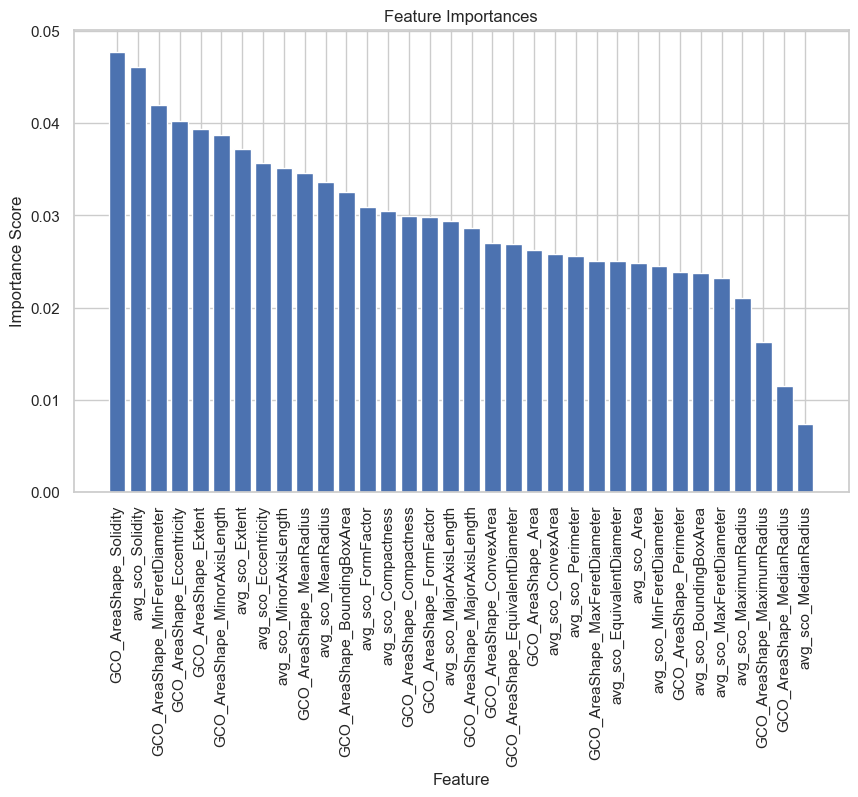

In [261]:
import matplotlib.pyplot as plt

# Get feature importances from the trained model
importances = rf_classifier.feature_importances_

# Sort feature importances in descending order
sorted_indices = importances.argsort()[::-1]
sorted_importances = importances[sorted_indices]

# Get the names of the features in the original order
feature_names = X.columns[sorted_indices]

# Create a bar plot of feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(X.shape[1]), sorted_importances, tick_label=feature_names)
plt.xticks(rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance Score')
plt.title('Feature Importances')
plt.show()


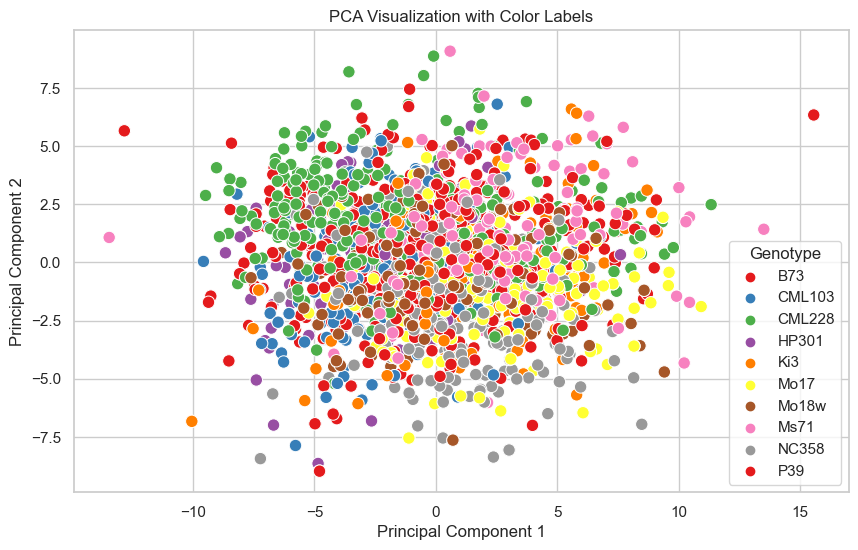

In [262]:
# Redo the PCA base on average parameters of SCO1 and SCO2
col_list = feature_names
selected_cols = df_GC0_AVG_SCO[col_list]

# Select numeric columns for normalization
numeric_columns = df_GC0_AVG_SCO[col_list]


# Apply PCA
pca = PCA()
pca_result = pca.fit_transform(numeric_columns)

# Create a DataFrame with PCA results
pca_columns = [f'PC{i+1}' for i in range(pca_result.shape[1])]
pca_df = pd.DataFrame(data=pca_result, columns=pca_columns)

# Concatenate the PCA DataFrame with non-numeric columns
final_df = pd.concat([df_GC0_AVG_SCO.drop(columns=numeric_columns.columns), pca_df], axis=1)


final_df.to_csv("final_df.csv")

# Plotting PCA results with color labels based on 'Metadata_genotype.x'
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.scatterplot(x='PC1', y='PC2', hue='Metadata_genotype.x', data=final_df, palette='Set1', s=80)

plt.title('PCA Visualization with Color Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Genotype')

plt.show()


In [263]:
import pandas as pd

# Assuming df is your DataFrame
# df = result_df

# Select columns for correlation
selected_columns = selected_cols 
selected_columns.head()

# Calculate the correlation matrix

correlation_matrix =selected_columns.corr()

correlation_matrix.head()




,GCO_AreaShape_Solidity,avg_sco_Solidity,GCO_AreaShape_MinFeretDiameter,GCO_AreaShape_Eccentricity,GCO_AreaShape_Extent,GCO_AreaShape_MinorAxisLength,avg_sco_Extent,avg_sco_Eccentricity,avg_sco_MinorAxisLength,GCO_AreaShape_MeanRadius,...,avg_sco_EquivalentDiameter,avg_sco_Area,avg_sco_MinFeretDiameter,GCO_AreaShape_Perimeter,avg_sco_BoundingBoxArea,avg_sco_MaxFeretDiameter,avg_sco_MaximumRadius,GCO_AreaShape_MaximumRadius,GCO_AreaShape_MedianRadius,avg_sco_MedianRadius
GCO_AreaShape_Solidity,1.000000,0.011259,-0.156346,-0.323728,0.724930,0.238720,-0.024516,-0.064490,0.028339,0.419579,...,-0.057506,-0.057313,0.004741,-0.126939,-0.032347,-0.041391,-0.021419,0.071668,0.389902,-0.033193
avg_sco_Solidity,0.011259,1.000000,-0.056673,-0.160109,0.129824,-0.050231,0.791888,0.183267,-0.315411,-0.055031,...,-0.144997,-0.156400,-0.425115,-0.263020,-0.457922,-0.243429,-0.062146,-0.058628,-0.032449,0.112259
GCO_AreaShape_MinFeretDiameter,-0.156346,-0.056673,1.000000,-0.461128,-0.162062,0.895917,-0.163282,-0.096617,0.267810,0.784774,...,0.342145,0.336735,0.308655,0.500570,0.331208,0.228800,0.308092,0.857415,0.664698,0.271417
GCO_AreaShape_Eccentricity,-0.323728,-0.160109,-0.461128,1.000000,-0.249518,-0.582775,-0.144262,0.359793,-0.074239,-0.497134,...,0.191036,0.192224,-0.042905,0.414112,0.208961,0.483944,-0.028978,-0.408536,-0.414621,-0.063809
GCO_AreaShape_Extent,0.724930,0.129824,-0.162062,-0.249518,1.000000,0.176421,0.173190,-0.084103,0.025226,0.301229,...,-0.067202,-0.069382,-0.054986,-0.121064,-0.126077,-0.065666,0.012404,0.054558,0.296611,-0.013102


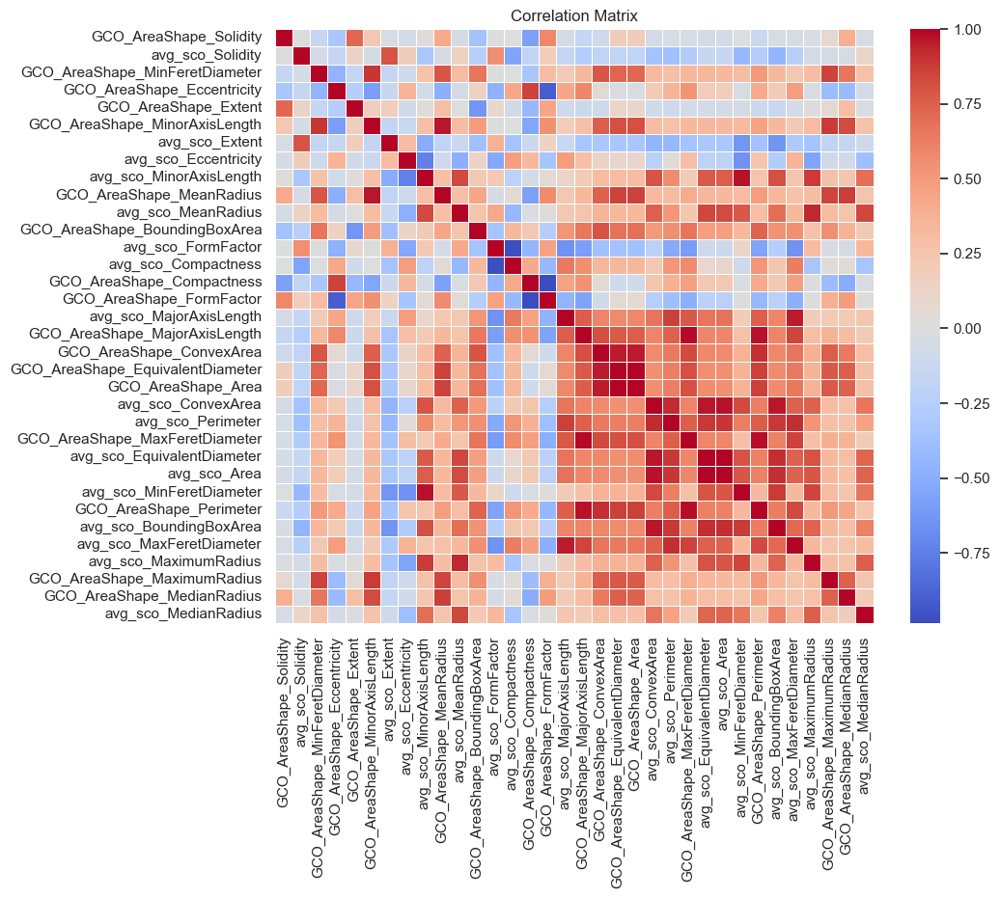

In [264]:

# Select columns for correlation
selected_columns = selected_cols 
selected_columns.head()

# Calculate the correlation matrix

correlation_matrix =selected_columns.corr()

correlation_matrix.head()
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [265]:
# Group by week and genotype and calculate the mean for all columns


df_morph = df_GC0_AVG_SCO.copy()
aggregated_df = df_morph.groupby(['Metadata_number.x', 'Metadata_genotype.x']).mean().reset_index()


# Display the aggregated DataFrame
#print(aggregated_df)

#Metadata_week.x Metadata_genotype.x
gs_data = pd.read_csv("/users/houlinyu/Desktop/umass/image_analysis/gs_closing.csv")
gs_data.head()

,Round,Genotype,k,L,Gmax,Gmin,T,Slmax,Delta G,Group,Subgroup
0,2,A619,140.841968,77.672975,211.752182,21.705638,328.289012,9846.855781,190.046543,NSS,NSS-M14:Oh43
1,21,A619,41.020982,15.294868,160.875774,10.097549,88.288139,2275.360394,150.778225,NSS,NSS-M14:Oh43
2,22,A619,13.896599,92.667428,51.026116,5.952693,117.395218,230.427651,45.073423,NSS,NSS-M14:Oh43
3,22-1,A619,294.063684,-220.196636,173.083360,39.398680,303.064124,14462.006460,133.684680,NSS,NSS-M14:Oh43
4,22-2,A619,80.934034,3.597789,124.696090,13.244247,147.612867,3318.363522,111.451843,NSS,NSS-M14:Oh43


In [266]:
    
# Convert 'Metadata_number.x' column to the same data type as 'Round'
aggregated_df['Metadata_number.x'] = aggregated_df['Metadata_number.x'].astype(str)

# Convert 'Metadata_genotype.x' column to the same data type as 'Genotype'
aggregated_df['Metadata_genotype.x'] = aggregated_df['Metadata_genotype.x'].astype(str)

# Now, perform the merge
merged_df = pd.merge(aggregated_df, gs_data, 
                     left_on=['Metadata_number.x', 'Metadata_genotype.x'], 
                     right_on=['Round', 'Genotype'], 
                     how='left')
merged_df.to_csv("merged_df.csv", index = False)

In [267]:
# Identify numeric and non-numeric columns
numeric_columns = merged_df.select_dtypes(include=['number']).columns
non_numeric_columns = merged_df.select_dtypes(exclude=['number']).columns


# Separate data into numeric and non-numeric DataFrames
numeric_data = merged_df[numeric_columns]
non_numeric_data = merged_df[non_numeric_columns]

# Scale the numeric data using StandardScaler
scaler = StandardScaler()
scaled_numeric_data = scaler.fit_transform(numeric_data)
print(scaled_numeric_data)
# Convert the scaled numeric data back to a DataFrame
scaled_numeric_df = pd.DataFrame(scaled_numeric_data, columns=numeric_columns)

# Concatenate the non-numeric data and the scaled numeric data
scaled_df = pd.concat([non_numeric_data, scaled_numeric_df], axis=1)

scaled_df.to_csv("scaled_gs_morphology.csv", index = False)


[[-0.87800915 -0.53084473  0.7280695  ... -0.31936509  0.48153528
   1.43487496]
 [-0.16028229 -0.09205408 -0.56767942 ... -0.07175383 -0.19090408
  -0.4892466 ]
 [-0.54438808  0.36168588  1.53573471 ...         nan         nan
          nan]
 ...
 [ 1.85747132  2.00089224 -1.34458032 ...  3.5408501   3.12117474
  -0.33512621]
 [-0.17470586 -1.10827642 -0.81046635 ...  0.38277266  0.07720179
  -0.58612916]
 [-1.84433644 -2.25062928  0.58366387 ... -1.04716541 -1.08531399
  -0.13650284]]


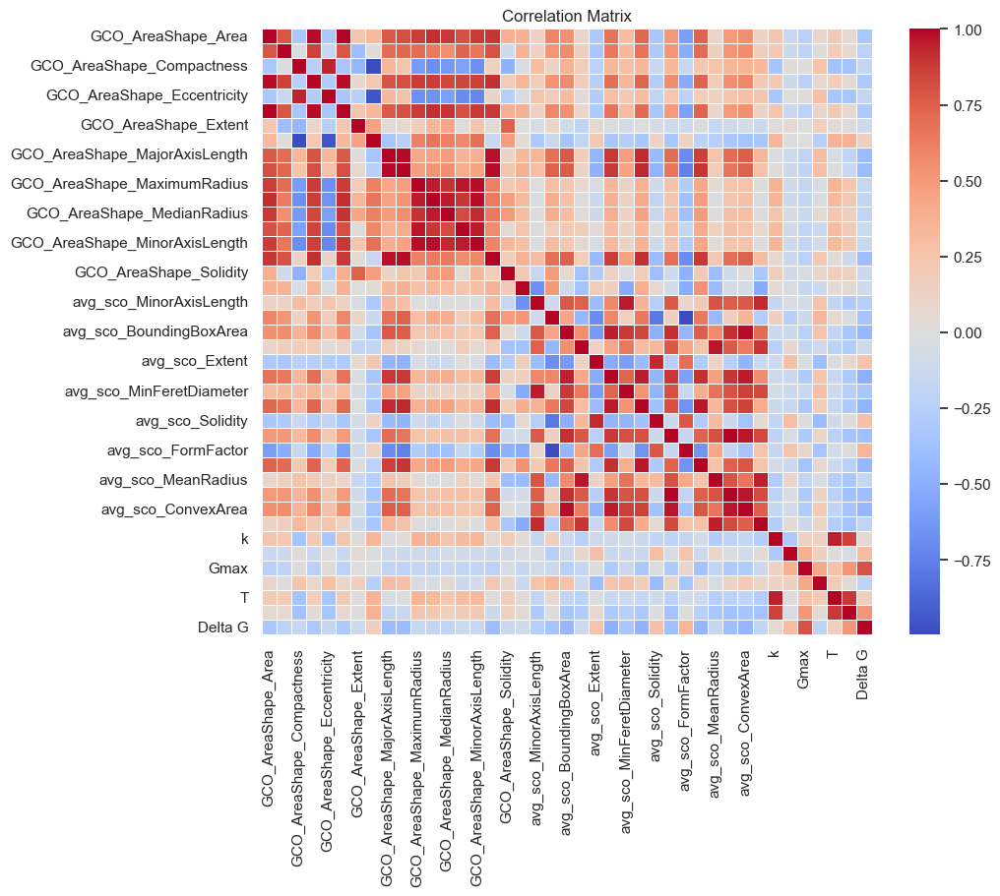

In [268]:

# Select columns for correlation
selected_columns = scaled_numeric_df.dropna()
selected_columns.head()

# Calculate the correlation matrix

correlation_matrix =selected_columns.corr()

correlation_matrix.head()
import seaborn as sns
import matplotlib.pyplot as plt

# Create a heatmap of the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

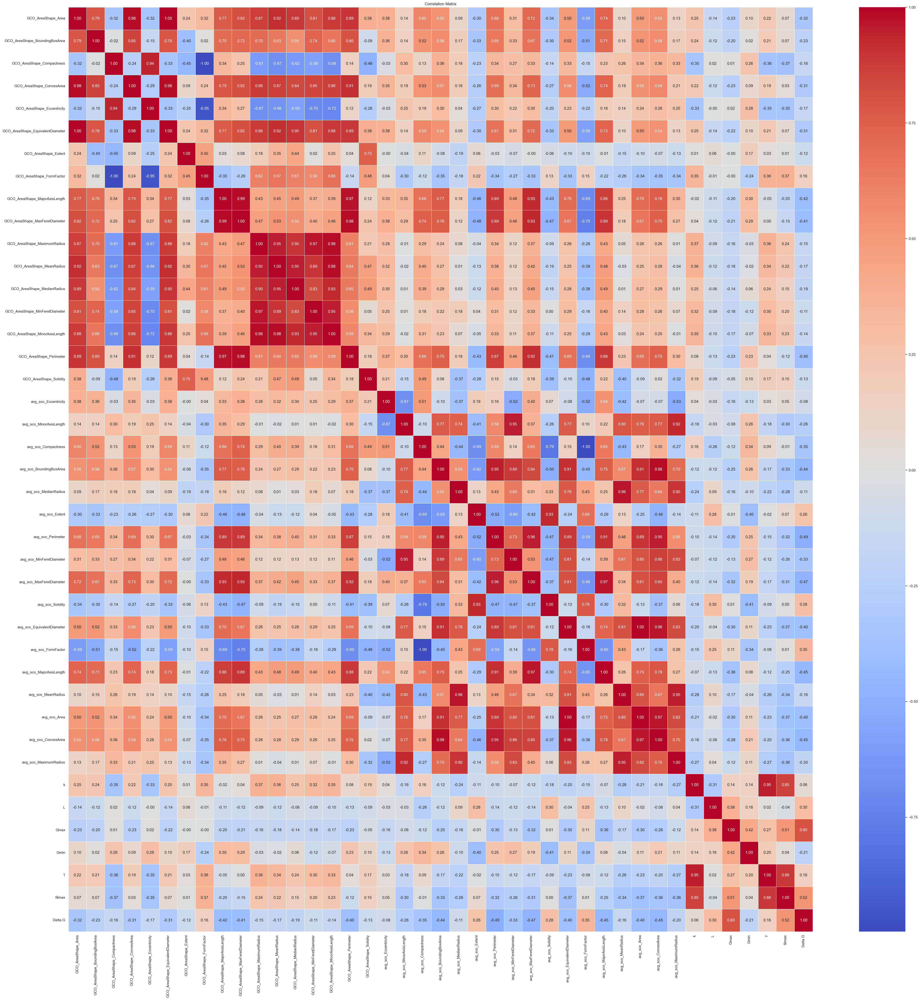

In [275]:
plt.figure(figsize=(50, 50))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.4)
plt.title('Correlation Matrix')
plt.show()

In [112]:
os.getcwd()
df = pd.read_csv('/Users/houlinyu/Desktop/GC_SC_merge.csv')
selected_columns = df[['Metadata_genotype.x', 'Metadata_week.x']]
Oscar_df = selected_columns.drop_duplicates()
Oscar_df['sources'] = 'Oscar'
Oscar_df.rename(columns={'Metadata_genotype.x': 'Genotype_img', 'Metadata_week.x': 'Round_img'}, inplace=True)


# Iterate through the rows
for index, row in Oscar_df.iterrows():
    # Extract numbers from the 'Round' column and assign to 'Round_img' column
    Oscar_df.at[index, 'Round_img'] = row['Round_img'].replace('Week', '')


# Display the updated DataFrame
print(Oscar_df.head())
Oscar_df.head()



    Genotype_img Round_img sources
0            B73         1   Oscar
78        CML103         1   Oscar
133       CML228         1   Oscar
184        HP301         1   Oscar
272          Ki3         1   Oscar


/var/folders/gt/w451x6dd2xs29hm6r8jx9bph0000gn/T/ipykernel_33263/1561155461.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Oscar_df['sources'] = 'Oscar'
/var/folders/gt/w451x6dd2xs29hm6r8jx9bph0000gn/T/ipykernel_33263/1561155461.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Oscar_df.rename(columns={'Metadata_genotype.x': 'Genotype_img', 'Metadata_week.x': 'Round_img'}, inplace=True)


,Genotype_img,Round_img,sources
0,B73,1,Oscar
78,CML103,1,Oscar
133,CML228,1,Oscar
184,HP301,1,Oscar
272,Ki3,1,Oscar


In [113]:

nia_dir = '/Users/houlinyu/Documents/Nia_output'

# Get a list of files in the directory
files = os.listdir(nia_dir)

# Iterate through the files and rename them
for file_name in files:
    if file_name.startswith('Copy of '):
        # Construct the new file name by removing the "Copy of " prefix
        new_file_name = file_name.replace('Copy of ', '', 1)
        
        # Construct the full path of the original and new files
        old_path = os.path.join(nia_dir, file_name)
        new_path = os.path.join(nia_dir, new_file_name)
        
        # Rename the file
        os.rename(old_path, new_path)
      
    

In [125]:

files = os.listdir(nia_dir)

genotypes = []
weeks = []
sources = []
for file in files:
    parts = file.split('_')
    genotype = parts[0]
    week = parts[1]
    sources = 'Nia'
    genotypes.append(genotype)
    weeks.append(week)
# Create a DataFrame
Nia_df = pd.DataFrame({'Genotype_img': genotypes, 'Round_img': weeks, 'sources' : sources})
 
Nia_df = Nia_df.drop_duplicates()
# Find unique values in the "Genotype_img" column



unique_genotypes = Nia_df_no_duplicates['Genotype_img'].unique()
Nia_df['Genotype_img'] = Nia_df['Genotype_img'].replace('a619', 'A619', regex=True)

# Print the result
print(unique_genotypes)



['M37w' 'CML333' 'CML247' 'A619' '.DS' 'CML69' 'a619' 'CML322' '3D'
 'CML52' 'OH43' 'Ki11' 'CML427']


In [128]:

combined_df = Oscar_df.append(Nia_df, ignore_index=True)
#combined_df = pd.append(Oscar_df, Nia_df)

print(combined_df)
combined_df['Genotype_img'] = combined_df['Genotype_img'].replace('Mo18w', 'Mo18', regex=True)
combined_df['Genotype_img'] = combined_df['Genotype_img'].replace('ki3', 'Ki3', regex=True)
combined_df['Genotype_img'] = combined_df['Genotype_img'].replace('p39', 'P39', regex=True)
combined_df['Genotype_img'] = combined_df['Genotype_img'].replace('P39Gb', 'P39', regex=True)



unique_genotypes = combined_df['Genotype_img'].unique()
print(unique_genotypes)

   Genotype_img Round_img sources
0           B73         1   Oscar
1        CML103         1   Oscar
2        CML228         1   Oscar
3         HP301         1   Oscar
4           Ki3         1   Oscar
..          ...       ...     ...
70       CML247      19-2     Nia
71        CML52         1     Nia
72       CML427         4     Nia
73         Ki11         5     Nia
74       CML247         5     Nia

[75 rows x 3 columns]
['B73' 'CML103' 'CML228' 'HP301' 'Ki3' 'Mo17' 'Mo18' 'Ms71' 'NC358' 'P39'
 'M37w' 'CML333' 'CML247' 'A619' '.DS' 'CML69' 'CML322' '3D' 'CML52'
 'OH43' 'Ki11' 'CML427']


/var/folders/gt/w451x6dd2xs29hm6r8jx9bph0000gn/T/ipykernel_33263/4004589967.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  combined_df = Oscar_df.append(Nia_df, ignore_index=True)


In [129]:
gs_data = pd.read_csv("/users/houlinyu/Desktop/umass/image_analysis/gs_closing.csv")


gs_data_info = gs_data[['Genotype', 'Round']]
gs_data_info.head()
gs_data_info.rename(columns={'Genotype':'Genotype_gs', 'Round':'Round_gs'}, inplace=True)

gs_data_info.head()


combined_df2 = pd.merge(gs_data_info, combined_df, how='left', left_on=['Genotype_gs', 'Round_gs'],
                       right_on=['Genotype_img', 'Round_img'])

print(combined_df2)
combined_df2.to_csv('/users/houlinyu/Desktop/combined_df2.csv')

    Genotype_gs Round_gs Genotype_img Round_img sources
0          A619        2          NaN       NaN     NaN
1          A619       21          NaN       NaN     NaN
2          A619       22          NaN       NaN     NaN
3          A619     22-1          NaN       NaN     NaN
4          A619     22-2          NaN       NaN     NaN
..          ...      ...          ...       ...     ...
260         W22       34          NaN       NaN     NaN
261         W22       35          NaN       NaN     NaN
262         W22        4          NaN       NaN     NaN
263         W22        5          NaN       NaN     NaN
264         W22        6          NaN       NaN     NaN

[265 rows x 5 columns]


/var/folders/gt/w451x6dd2xs29hm6r8jx9bph0000gn/T/ipykernel_33263/2374148091.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gs_data_info.rename(columns={'Genotype':'Genotype_gs', 'Round':'Round_gs'}, inplace=True)


In [ ]:
# Feature selection~~~


In [6]:
# Select only numeric columns for PCA
numeric_columns = df_filtered.select_dtypes(include='number').columns

# Extract numeric data for PCA
data_for_pca = df_filtered[numeric_columns]


print(cleaned_df_1)
    
# Standardize the data using StandardScaler
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data_for_pca)

# Apply PCA
pca = PCA()
pca_result = pca.fit_transform(scaled_data)

# Optional: Print the explained variance ratio
print("Explained Variance Ratio:")
print(pca.explained_variance_ratio_)

# Now, pca_result contains the transformed data after PCA
# You can further analyze or visualize the principal components as needed

Explained Variance Ratio:
[2.18478715e-01 1.69240619e-01 1.20598365e-01 9.42877035e-02
 6.18851167e-02 4.25329797e-02 3.31405988e-02 3.07417435e-02
 2.75586928e-02 2.43357659e-02 2.08616486e-02 1.77333333e-02
 1.50307842e-02 1.26672249e-02 1.07507593e-02 1.01549695e-02
 1.00735069e-02 9.30263563e-03 8.54941810e-03 7.85458112e-03
 6.69437521e-03 6.02566544e-03 4.85790045e-03 4.54810333e-03
 3.85342265e-03 3.49367909e-03 2.79607871e-03 2.44328600e-03
 2.10920393e-03 2.03651012e-03 1.87142945e-03 1.77944550e-03
 1.73132663e-03 1.43287692e-03 1.24822197e-03 1.20120889e-03
 9.84249441e-04 8.14252398e-04 7.75079534e-04 4.70541840e-04
 3.62072553e-04 3.08959365e-04 2.63944894e-04 2.28398556e-04
 2.14613362e-04 1.94020972e-04 1.81952211e-04 1.60896111e-04
 1.44093476e-04 1.28347488e-04 1.23811805e-04 1.02007892e-04
 9.52965438e-05 7.21810442e-05 6.71020826e-05 5.86389560e-05
 5.36127105e-05 4.51790325e-05 4.47442337e-05 3.13812579e-05
 2.92432809e-05 2.73959909e-05 2.28210649e-05 1.81179502e-0

In [8]:
# Merge aggregated_df with gs based on 'Metadata_week.x' and 'Metadata_genotype.x' in aggregated_df
# and 'Round' and 'Genotype' in gs


Explained Variance Ratio:
[2.18478715e-01 1.69240619e-01 1.20598365e-01 9.42877035e-02
 6.18851167e-02 4.25329797e-02 3.31405988e-02 3.07417435e-02
 2.75586928e-02 2.43357659e-02 2.08616486e-02 1.77333333e-02
 1.50307842e-02 1.26672249e-02 1.07507593e-02 1.01549695e-02
 1.00735069e-02 9.30263563e-03 8.54941810e-03 7.85458112e-03
 6.69437521e-03 6.02566544e-03 4.85790045e-03 4.54810333e-03
 3.85342265e-03 3.49367909e-03 2.79607871e-03 2.44328600e-03
 2.10920393e-03 2.03651012e-03 1.87142945e-03 1.77944550e-03
 1.73132663e-03 1.43287692e-03 1.24822197e-03 1.20120889e-03
 9.84249441e-04 8.14252398e-04 7.75079534e-04 4.70541840e-04
 3.62072553e-04 3.08959365e-04 2.63944894e-04 2.28398556e-04
 2.14613362e-04 1.94020972e-04 1.81952211e-04 1.60896111e-04
 1.44093476e-04 1.28347488e-04 1.23811805e-04 1.02007892e-04
 9.52965438e-05 7.21810442e-05 6.71020826e-05 5.86389560e-05
 5.36127105e-05 4.51790325e-05 4.47442337e-05 3.13812579e-05
 2.92432809e-05 2.73959909e-05 2.28210649e-05 1.81179502e-0

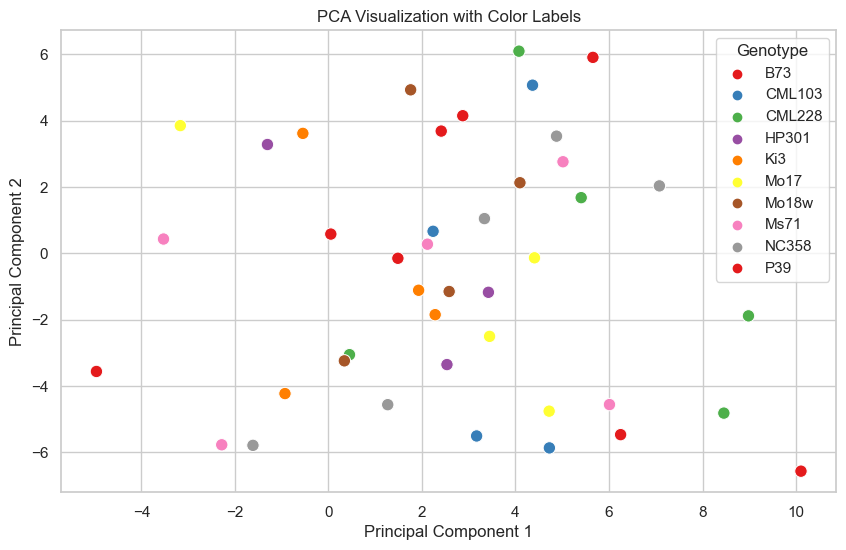

In [9]:
# Select only numeric columns for PCA
numeric_columns = scaled_df.select_dtypes(include='number').columns

# Extract numeric data for PCA
data_for_pca = scaled_df[numeric_columns]

# Check for infinite or very large values
if np.any(np.isinf(data_for_pca)) or np.any(np.abs(data_for_pca) > 1e15):
    # Handle or remove the infinite or very large values
    data_for_pca = data_for_pca.replace([np.inf, -np.inf], np.nan)
    data_for_pca = data_for_pca.dropna()
    

# Apply PCA
pca = PCA()
pca_result = pca.fit_transform(scaled_data)

# Optional: Print the explained variance ratio
print("Explained Variance Ratio:")
print(pca.explained_variance_ratio_)

# Create a DataFrame with PCA results and the non-numeric column 'Metadata_genotype.x'
pca_df = pd.DataFrame(data=pca_result, columns=[f'PC{i+1}' for i in range(len(pca_result[0]))])
pca_df['Metadata_genotype.x'] = scaled_df['Metadata_genotype.x']

# Plotting PCA results with color labels based on 'Metadata_genotype.x'
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))

sns.scatterplot(x='PC1', y='PC2', hue='Metadata_genotype.x', data=pca_df, palette='Set1', s=80)

plt.title('PCA Visualization with Color Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Genotype')

plt.show()


In [10]:
# Drop rows with missing values (NaN) from the original DataFrame
merged_df_cleaned_no_na = merged_df.dropna()

# Select numeric columns for scaling
numeric_columns = merged_df_cleaned_no_na.select_dtypes(include='number')

# Scale the data using StandardScaler
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_columns)


# Convert the scaled data back to a DataFrame
scaled_df = pd.DataFrame(data=scaled_data, columns=numeric_columns.columns)



# Calculate Pearson correlation matrix
correlation_matrix_scaled = scaled_df.corr()


# Create a scatter plot matrix with correlation values
sns.set(style="ticks")
scatter_plot = sns.pairplot(scaled_df, diag_kind='kde')
plt.suptitle('Scatter Plot Matrix with Correlation Values', y=1.02)

# Add a heatmap of the correlation matrix to the upper triangle of the scatter plot matrix
corr_heatmap = scatter_plot.fig.add_gridspec(1, 1).subplots(0, 1)
sns.heatmap(correlation_matrix, cmap='coolwarm', cbar=False, ax=corr_heatmap)

plt.show()

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x14ae75ee0> (for post_execute):


KeyboardInterrupt: 

In [71]:
commit = "da8ae6a3bc103346095d61b4ee02f08fc85a5d98"
url = f"https://media.githubusercontent.com/media/broadinstitute/lincs-cell-painting/{commit}/profiles/2016_04_01_a549_48hr_batch1/SQ00014812/SQ00014812_augmented.csv.gz"

df = pd.read_csv(url)

normalized_df = pycytominer.normalize(
    profiles=df,
    method="standardize",
    samples="Metadata_broad_sample == 'DMSO'"
)


